In [17]:
# importing required libraries
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
import os
import requests
import IPython.display as display
import PIL.Image

In [39]:
# downloading content and style images
def download_img(url, dest_path):
  with open(dest_path, 'wb') as f :
    response = requests.get(url)
    f.write(response.content)

content_img_url  = 'https://wallpaperaccess.com/full/2360062.jpg'
style_img_url    = 'https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/757px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg'
# style_img_url = 'https://images.unsplash.com/photo-1607457632731-266db62789fa?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=2070&q=80'

# style_img_url = 'https://images.unsplash.com/photo-1541661538396-53ba2d051eed?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=654&q=80'

content_imgpath  = 'content_img.jpg'
style_imgpath    = 'style_img.jpg'

download_img(content_img_url, content_imgpath)
download_img(style_img_url, style_imgpath)

In [40]:
# reading and displaying content and style images
content_img = cv2.imread(content_imgpath)
content_img = cv2.cvtColor(content_img, cv2.COLOR_BGR2RGB) # converting from BGR to RGB(Red-Green-Blue) format since cv2 loads images in BGR format
content_img = content_img/255. # normalizing to have values in the range 0-1

style_img   = cv2.imread(style_imgpath)
style_img   = cv2.cvtColor(style_img, cv2.COLOR_BGR2RGB) # converting from BGR to RGB(Red-Green-Blue) format since cv2 loads images in BGR format
style_img   = style_img/255. # normalizing to have values in the range 0-1

Resolution content_img: (1095, 730, 3), style_img: (599, 757, 3)
Range of values in content image: 0.0 - 1.0 , range of values in style image: 0.0 - 1.0


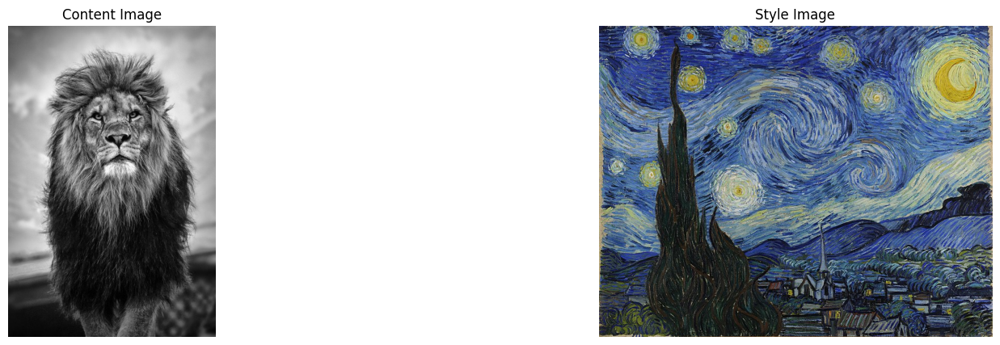

In [41]:
print(f"Resolution content_img: {content_img.shape}, style_img: {style_img.shape}")
print(f"Range of values in content image: {np.min(content_img)} - {np.max(content_img)} , range of values in style image: {np.min(style_img)} - {np.max(style_img)}")

# displaying content, style and generated style transferred images
fig, ax = plt.subplots(1, 2, figsize=(20,5))

ax[0].imshow(content_img)
ax[0].title.set_text('Content Image')
ax[0].axis('off')

ax[1].imshow(style_img)
ax[1].title.set_text('Style Image')
ax[1].axis('off')

plt.show()

In [42]:
# loading pretrained VGG19 model
base_model_vgg = tf.keras.applications.VGG19(include_top=False , weights='imagenet')
base_model_vgg.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [43]:
# selecting layers (by name included in model summary) for extracting the content and style of an image
# inner layers other than the ones selected are also potential choices for extracting content and style

style_layer_names   = ['block1_conv1',
                       'block2_conv1',
                       'block3_conv1',
                       'block4_conv1',
                       'block5_conv1']
num_style_layers    = len(style_layer_names)

content_layer_name  = ['block5_conv2']
assert (len(content_layer_name) == 1) , 'code assumes only 1 content layer is used'

print("Number of style layers used: {}".format(num_style_layers))

Number of style layers used: 5


In [44]:
# defining function which returns a model for extracting outputs from inner layers of VGG19
def get_model_layer_outputs(base_model, style_layer_names, content_layer_names):
  layer_names = style_layer_names + content_layer_names
  outputs = [base_model.get_layer(name).output for name in layer_names]
  model   = tf.keras.Model([base_model.input], outputs)
  model.trainable = False
  return model

model = get_model_layer_outputs(base_model_vgg, style_layer_names, content_layer_name)


In [45]:
# defining function for computing the Gram Matrix
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape   = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32) # total number of i,j pixel locations . computing for normalizing the result
  return result/num_locations


In [46]:
# defining function for extracting image style and content
# img_tensor - input image tensor for which style and content features are calculated
# mode_layer_outputs - model for extracting style and content outputs .
def extract_style_content(img_tensor, model) :
  preprocessed_img = tf.keras.applications.vgg19.preprocess_input(img_tensor*255.) # preprocessing specific to vgg19 model. Multiplying by 255. since preprocess function expects float inputs in range 0-255.
  outputs = model(preprocessed_img)
  content_output = outputs[-1] # selecting last output and
  style_outputs  = outputs[:-1] # a list of style layer outputs
  style_outputs  = [gram_matrix(style_output) for style_output in style_outputs] # extracting style for each style layer using Gram matrix
  return style_outputs, content_output


In [66]:
# defining the loss function
# target_style_outputs refers to style outputs of the style image
# target_content_output refers to content output of the content_image
def custom_loss(style_outputs, content_output, target_style_outputs, target_content_output) :
  # style_weight = 1e-2  # tunable hyperparameter
  # content_weight = 1e4 # tunable hyperparameter
  style_weight = 1e6
  content_weight = 5e0

  style_layer_losses = [ tf.reduce_mean((output - target_output)**2) for output, target_output in zip(style_outputs, target_style_outputs)  ]
  style_loss = tf.add_n(style_layer_losses)/len(style_layer_losses)

  content_loss = tf.reduce_mean( (content_output - target_content_output)**2  )

  total_loss = style_weight*style_loss + content_weight*content_loss
  return total_loss


In [67]:
# initializing various parameters

# computing target content and style outputs
content_img_tensor = tf.expand_dims(tf.constant(content_img),axis=0)
_ , target_content_output = extract_style_content( content_img_tensor , model) # selecting content of content image

style_img_tensor = tf.expand_dims(tf.constant(style_img),axis=0)
target_style_outputs, _ = extract_style_content( style_img_tensor , model) # selecting style of style image


In [68]:
# defining the optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.02)

In [69]:
# defining a function to clip the pixel values to the range 0-1 (used during training)
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [71]:
# defining function for single step through the training loop
@tf.function()
def train_step(img, model, optimizer, target_style_outputs, target_content_output):

  with tf.GradientTape() as tape :
    style_outputs, content_output = extract_style_content(img, model)
    loss = custom_loss(style_outputs, content_output, target_style_outputs, target_content_output)

  grad = tape.gradient(loss, img)
  optimizer.apply_gradients([(grad,img)])
  img.assign(clip_0_1(img))


img shape: (1, 1095, 730, 3)


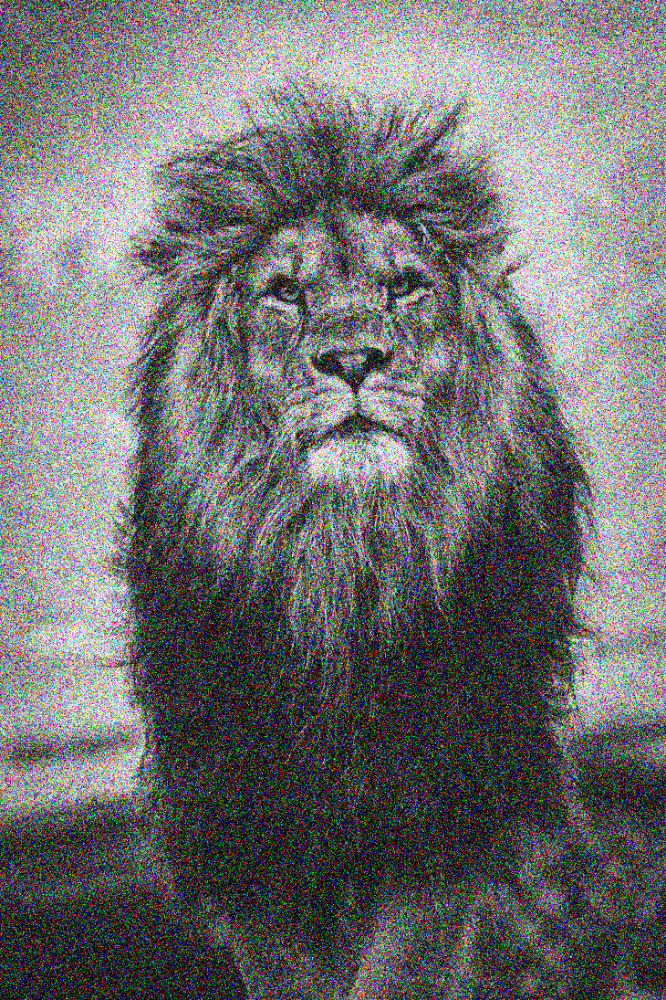

In [72]:
# initializing the input image which will be updated during training and is the same as the generated style-transferred image
img = content_img.copy() + 0.35*np.random.randn(*content_img.shape) # initializing generated image to be same as content image + added random noise
img = np.clip(img, 0. , 1.)
img = np.expand_dims(img, axis=0)
print(f"img shape: {img.shape}")

img = tf.Variable(img) # converting to tensorflow variable

# visualizing initial image
display.display(tensor_to_image(img))


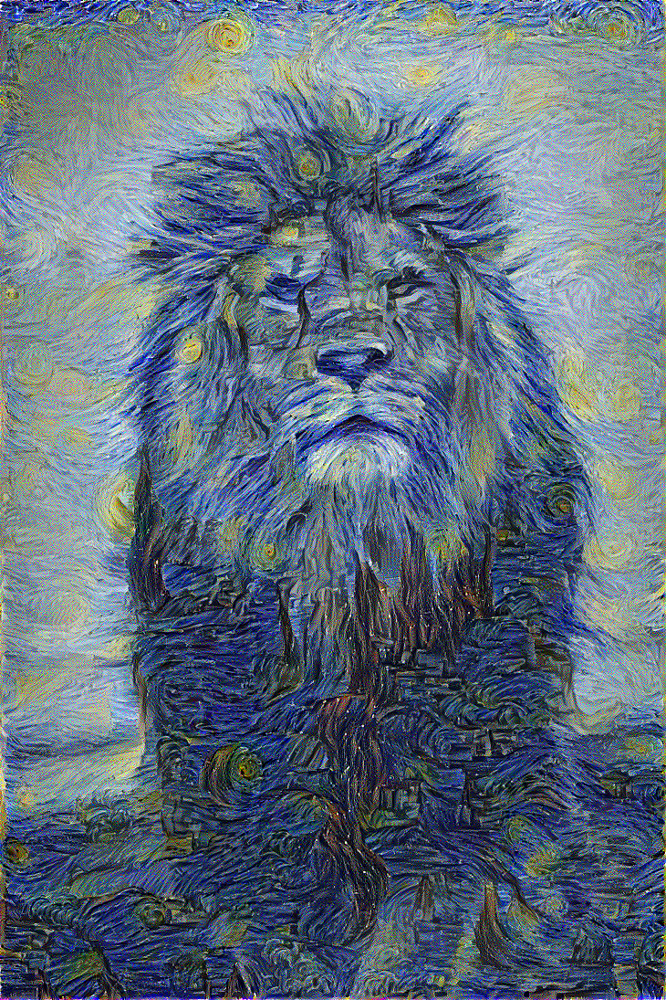

Train step: 999Train epoch: 1


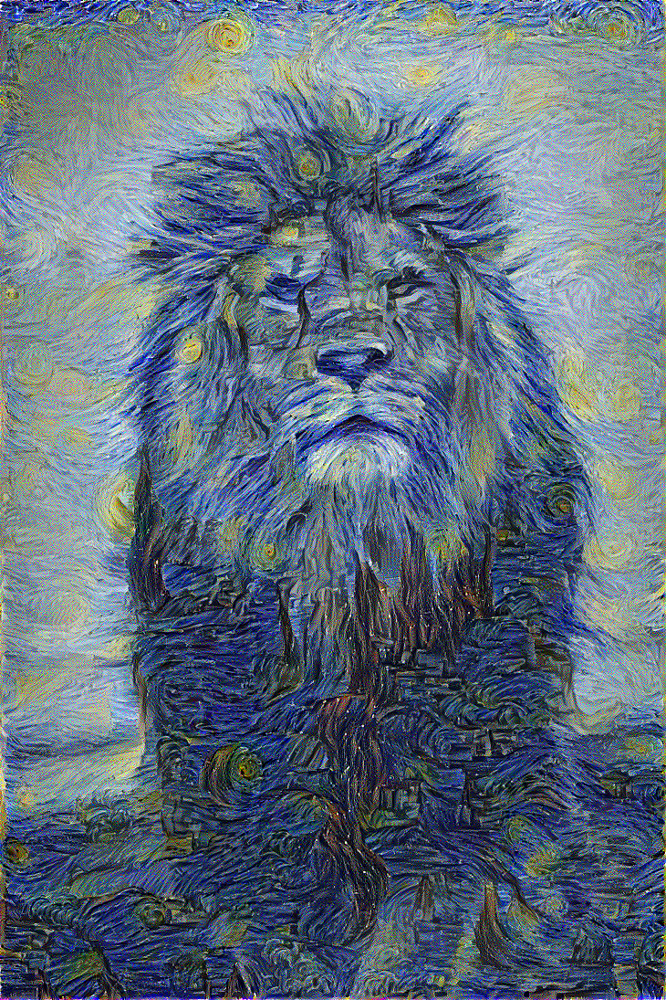

Train step: 2000
Train epoch: 1
Total training time: 13759.9 seconds


In [76]:
# defining the training loop
num_epochs = 2
steps_per_epoch = 1000
step = 0

start = time.time()
for n in range(num_epochs) :
  for m in range(steps_per_epoch):
    step = step + 1
    train_step(img, model, optimizer, target_style_outputs, target_content_output)
    display.clear_output(wait=True)
    display.display(tensor_to_image(img))
    print(f"Train step: {m}",end='')
    print(f"Train epoch: {n}")
  # display.clear_output(wait=True)
  display.display(tensor_to_image(img))
  print("Train step: {}".format(step))
  print(f"Train epoch: {n}")
end = time.time()

print("Total training time: {:.1f} seconds".format(end-start))

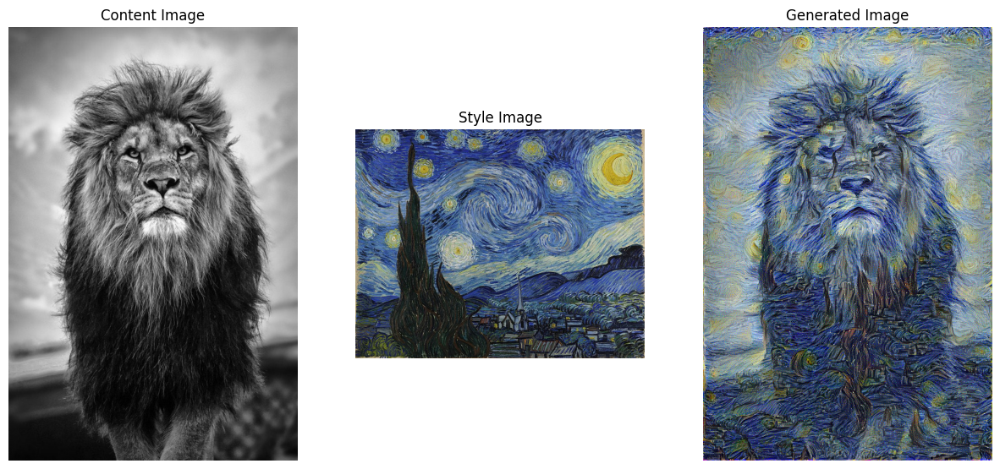

In [77]:
# displaying content, style and generated style transferred images
fig, ax = plt.subplots(1, 3, figsize=(15,10))

ax[0].imshow(content_img)
ax[0].title.set_text('Content Image')
ax[0].axis('off')

ax[1].imshow(style_img)
ax[1].title.set_text('Style Image')
ax[1].axis('off')

generated_img = np.array(tensor_to_image(img))
ax[2].imshow(generated_img)
ax[2].title.set_text('Generated Image')
ax[2].axis('off')

plt.show()
fig.savefig('convert_vangogh.png')

In [1]:
from PIL import Image
im = Image.fromarray(generated_img)
im.save("vangohg_style_lion.jpg")

NameError: name 'generated_img' is not defined